<a href="https://colab.research.google.com/github/ihagoSantos/statistical_models/blob/main/logistic_regression_in_python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Regressão Logística Binária

In [2]:
import numpy as np
import pandas as pd
import warnings

# Suprimir os warnings
warnings.simplefilter(action='ignore', category=pd.errors.SettingWithCopyWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
doenca_pre = pd.read_csv('covid_doencas_preexistentes.csv', sep=';', encoding='utf-8')

# Análise Inicial
Verificando as variáveis carregadas no banco de dados \
Bases de dados tras a informação de pessoas que receberam o diagnóstico de COVID
perfil do paciente e doenças pré existentes.

In [4]:
doenca_pre.head()

,nome_munic,codigo_ibge,idade,cs_sexo,diagnostico_covid19,data_inicio_sintomas,obito,asma,cardiopatia,diabetes,doenca_hematologica,doenca_hepatica,doenca_neurologica,doenca_renal,imunodepressao,obesidade,outros_fatores_de_risco,pneumopatia,puerpera,sindrome_de_down
0,Carapicuíba,3510609,36.0,FEMININO,CONFIRMADO,2020-07-10,0,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO
1,Jacareí,3524402,54.0,FEMININO,CONFIRMADO,2020-07-09,0,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO
2,Vargem Grande Paulista,3556453,33.0,FEMININO,CONFIRMADO,2020-07-10,0,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO
3,Paulínia,3536505,47.0,FEMININO,CONFIRMADO,2021-01-25,0,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO
4,Santo André,3547809,41.0,FEMININO,CONFIRMADO,2021-01-10,0,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO


In [6]:
doenca_pre.shape

(530447, 20)

## 1° Análise: Verificar se existe uma tendência de óbito entre pessoas do sexo feminino e masculino

In [7]:
from collections import Counter

Fazer contagem por categoria das variáveis

In [8]:
Counter(doenca_pre.cs_sexo)

Counter({'FEMININO': 280749,
         'MASCULINO': 248305,
         'INDEFINIDO': 1385,
         'IGNORADO': 8})

In [9]:
doenca_pre['cs_sexo'].value_counts()

,count
cs_sexo,
FEMININO,280749
MASCULINO,248305
INDEFINIDO,1385
IGNORADO,8


Como queremos compararo gÊnero feminino e masculino, iremos desconsiderar as demais classes. \
Valores Missing (NAN)

In [10]:
doenca_pre.isnull().sum()

,0
nome_munic,0
codigo_ibge,0
idade,725
cs_sexo,0
diagnostico_covid19,0
data_inicio_sintomas,8769
obito,0
asma,0
cardiopatia,0
diabetes,0


Excluir valor NAN de cs_sexo

In [11]:
# Exemplo de exclusão de valores NAN
doenca_pre.dropna(subset=['cs_sexo'], inplace=True)

Excluir IGNORADO

In [12]:
relacao = doenca_pre.loc[doenca_pre.cs_sexo != 'IGNORADO']

Excluir INDEFINIDO

In [13]:
relacao = relacao.loc[relacao.cs_sexo != 'INDEFINIDO']

Verificando as variáveis que ficaram na base de dados

In [14]:
relacao['cs_sexo'].value_counts()

,count
cs_sexo,
FEMININO,280749
MASCULINO,248305


In [15]:
import plotly.express as px
px.pie(relacao, names='cs_sexo')

### Analisando a quantidade de óbitos

In [16]:
relacao.obito.value_counts()

,count
obito,
0,512530
1,16524


In [17]:
px.pie(relacao,names='obito')

### Análise da classificação dos atributos
Verificando como o Python reconheceu as variáveis

In [18]:
relacao.dtypes

,0
nome_munic,object
codigo_ibge,int64
idade,float64
cs_sexo,object
diagnostico_covid19,object
data_inicio_sintomas,object
obito,int64
asma,object
cardiopatia,object
diabetes,object


### Renomeando (Sobrescrevendo) a variável obito

In [20]:
relacao['obito'] = relacao['obito'].replace({0: 'nao', 1: 'sim'})

In [21]:
relacao.head()

,nome_munic,codigo_ibge,idade,cs_sexo,diagnostico_covid19,data_inicio_sintomas,obito,asma,cardiopatia,diabetes,doenca_hematologica,doenca_hepatica,doenca_neurologica,doenca_renal,imunodepressao,obesidade,outros_fatores_de_risco,pneumopatia,puerpera,sindrome_de_down
0,Carapicuíba,3510609,36.0,FEMININO,CONFIRMADO,2020-07-10,nao,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO
1,Jacareí,3524402,54.0,FEMININO,CONFIRMADO,2020-07-09,nao,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO
2,Vargem Grande Paulista,3556453,33.0,FEMININO,CONFIRMADO,2020-07-10,nao,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO
3,Paulínia,3536505,47.0,FEMININO,CONFIRMADO,2021-01-25,nao,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO
4,Santo André,3547809,41.0,FEMININO,CONFIRMADO,2021-01-10,nao,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO


In [22]:
relacao.dtypes

,0
nome_munic,object
codigo_ibge,int64
idade,float64
cs_sexo,object
diagnostico_covid19,object
data_inicio_sintomas,object
obito,object
asma,object
cardiopatia,object
diabetes,object


In [23]:
relacao.obito.value_counts()

,count
obito,
nao,512530
sim,16524


### Transformando em variáveis categóricas
Transformando as variáveis que estão como objetos como categorias.

In [24]:
relacao['cs_sexo'] = relacao['cs_sexo'].astype('category')

In [25]:
relacao['obito'] = relacao['obito'].astype('category')

In [26]:
relacao.dtypes

,0
nome_munic,object
codigo_ibge,int64
idade,float64
cs_sexo,category
diagnostico_covid19,object
data_inicio_sintomas,object
obito,category
asma,object
cardiopatia,object
diabetes,object


# Modelo 1: Uma variável independente
Queremos entender se a pessoa que foi diagnosticada como COVID, existe uma relação entre o gênero e o óbito.\
Logo, teremos o primeiros modelo com uma única variável independente. \
## Pressupostos:
- Variável dependente binária (dicotômica) -> Variável resposta (Y) dicotômica: Óbito - Sim ou Não.
- Categorias mutuamente exclusivas - a mesma pessoa não pode estar em duas situações.
- Independência das observações (sem medidas repeditas) -> a mesma pessoa é analisada uma única v

In [27]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

Criação do modelo de Regressão Logística

In [28]:
modelo1 = smf.glm(formula = 'obito ~ cs_sexo', data=relacao, family=sm.families.Binomial()).fit()
print(modelo1.summary())

                      Generalized Linear Model Regression Results                       
Dep. Variable:     ['obito[nao]', 'obito[sim]']   No. Observations:               529054
Model:                                      GLM   Df Residuals:                   529052
Model Family:                          Binomial   Df Model:                            1
Link Function:                            Logit   Scale:                          1.0000
Method:                                    IRLS   Log-Likelihood:                -72880.
Date:                          Fri, 16 Aug 2024   Deviance:                   1.4576e+05
Time:                                  09:17:55   Pearson chi2:                 5.29e+05
No. Iterations:                               7   Pseudo R-squ. (CS):           0.002490
Covariance Type:                      nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
---------------------

# Deviance Residuals
**Hipótese Testada:**
- $H_0:$ O Modelo ajusta bem os dados.
- $H_a:$ O Modelo não ajusta bem os dados
**Condição de Aceitação/Rejeição:**
- A deviance total é comparada com uma distribuição qui-quadrado com $n - p$ graus de liberdade, onde $n$ é o número de observações e $p$ é o número de parâmetros do modelo.
- **Aceitação de $H_0$:** Se o valor $p$ calculado a partir da deviance é maior que $\alpha$, aceitamos $H_0$ e concluímos que o modelo ajusta bem os dados.
- **Rejeição de $H_0$:** Se o valor $p$ é menor que $\alpha$, rejeitamos $H_0$ e concluímos que o modelo não ajusta bem os dados.

In [29]:
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
from scipy.stats import chi2, chisquare
from statsmodels.graphics.regressionplots import abline_plot
import scipy.stats as stats # importando o módulo stats da biblioteca Scipy

In [30]:
# Teste de Deviance para os resíduos
deviance_test_statistic = modelo1.deviance
deviance_df = modelo1.df_resid
deviance_p_value = 1 - stats.chi2.cdf(deviance_test_statistic, deviance_df)

In [31]:
print("Teste de Deviance para os Resíduos:")
print("Estatística de teste:", deviance_test_statistic)
print("Graus de liberdade:", deviance_df)
print("Valor p:", deviance_p_value)

Teste de Deviance para os Resíduos:
Estatística de teste: 145760.72084686102
Graus de liberdade: 529052
Valor p: 1.0


# Testes de Adequação do Modelo
## 1. Pearson Chi-Square Test
**Hipótese Testada:**
- $H_0:$ O Modelo ajusta bem os dados.
- $H_a:$ O Modelo não ajusta bem os dados
**Condição de Aceitação/Rejeição:**
- Calcula-se a estatística do teste qui-quadrado de Pearson, que segue uma distribuição qui-quadrado com $n - p$ graus de liberdade.
- **Aceitação de $H_0$:** Se o valor $p$ é maior que $\alpha$, aceitamos $H_0$ e concluímos que o modelo ajusta bem os dados.
- **Rejeição de $H_0$:** Se o valor $p$ é menor que $\alpha$, rejeitamos $H_0$ e concluímos que o modelo não ajusta bem os dados.

In [32]:
# Obtendo os resíduos de PEarson
residuos_pearson = modelo1.resid_pearson

# Teste de Pearson para os Resíduos
pearson_test_statistic = np.sum(residuos_pearson**2)
pearson_df = len(residuos_pearson) - modelo1.df_model - 1 ## Graus de liberdade corrigidos
pearson_p_value = 1 - stats.chi2.cdf(pearson_test_statistic, pearson_df)

print("\nTeste de Paerson para os Resíduos:")
print("Estatística de teste:", pearson_test_statistic)
print("Graus de liberdade:", pearson_df)
print("Valor p:", pearson_p_value)


Teste de Paerson para os Resíduos:
Estatística de teste: 529053.9999999754
Graus de liberdade: 529052
Valor p: 0.4989657781835436


## 2. Teste de Hosmer-Lemeshow
**Hipótese Testada:**
- $H_0:$ O Modelo ajusta bem os dados (não há diferença significativa entre as frequências observadas e esperadas).
- $H_a:$ O Modelo não ajusta bem os dados (há diferença significativa entre as frequÊncias observadas e esperadas).
**Condição de Aceitação/Rejeição:**
- Calcula-se a estatística do teste Hosmer-Lemeshow, que segue uma distribuição qui-quadrado com $g - 2$ graus de liberdade, onde $g$ é o número de grupos.
- **Aceitação de $H_0$:** Se o valor $p$ é maior que o nível de significância $\alpha$ (geralmente 0.05), aceitamos $H_0$ e concluímos que o modelo ajusta bem os dados.
- **Rejeição de $H_0$:** Se o valor $p$ é menor que $\alpha$, rejeitamos $H_0$ e concluímos que o modelo não ajusta bem os dados.

In [33]:
def hosmer_lemeshow_test(model, g=10):
  data = pd.DataFrame({'observed': model.model.endog, 'predicted': model.fittedvalues})
  data['group'] = pd.qcut(data['predicted'], g, duplicates='drop')
  grouped = data.groupby('group')
  observed = grouped['observed'].sum()
  expected = grouped['predicted'].sum()
  hl_stat = ((observed - expected) ** 2 / (expected * (1 - expected / grouped.size()))).sum()
  hl_p_value = chi2.sf(hl_stat, g - 1)
  return hl_stat, hl_p_value

hl_stat, hl_p_value = hosmer_lemeshow_test(modelo1)
print(f"Hosmer-Lemeshow Test: Stat={hl_stat}, p-value={hl_p_value}")

Hosmer-Lemeshow Test: Stat=3.576947157638208e-23, p-value=1.0


In [34]:
modelo1.params

,0
Intercept,3.745863
cs_sexo[T.MASCULINO],-0.579783


**Observação:** Como vimos, a regressão logística retornará a probabilidade de sucesso (1), logo neste caso estamos analisando a probabilidade de ocorrência do óbito.\
Porém iremos verificar se realmente é isso que ocorre:

In [35]:
modelo_prova = smf.glm(formula='cs_sexo ~ obito', data=relacao, family=sm.families.Binomial()).fit()
print(modelo_prova.summary())

                              Generalized Linear Model Regression Results                              
Dep. Variable:     ['cs_sexo[FEMININO]', 'cs_sexo[MASCULINO]']   No. Observations:               529054
Model:                                                     GLM   Df Residuals:                   529052
Model Family:                                         Binomial   Df Model:                            1
Link Function:                                           Logit   Scale:                          1.0000
Method:                                                   IRLS   Log-Likelihood:            -3.6506e+05
Date:                                         Fri, 16 Aug 2024   Deviance:                   7.3011e+05
Time:                                                 09:17:58   Pearson chi2:                 5.29e+05
No. Iterations:                                              4   Pseudo R-squ. (CS):           0.002490
Covariance Type:                                     nonrobust  

Invertemos a variável dependente com a independente para verificar qual o Python está selecionando no modelo.

In [36]:
print(modelo1.summary())

                      Generalized Linear Model Regression Results                       
Dep. Variable:     ['obito[nao]', 'obito[sim]']   No. Observations:               529054
Model:                                      GLM   Df Residuals:                   529052
Model Family:                          Binomial   Df Model:                            1
Link Function:                            Logit   Scale:                          1.0000
Method:                                    IRLS   Log-Likelihood:                -72880.
Date:                          Fri, 16 Aug 2024   Deviance:                   1.4576e+05
Time:                                  09:17:58   Pearson chi2:                 5.29e+05
No. Iterations:                               7   Pseudo R-squ. (CS):           0.002490
Covariance Type:                      nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
---------------------

Como conseguir tirar alguma informação, interpretação do modelo?\
\
Iremos utilizar o que chamamos como razão de chance com intevalo de confiança de 95%:
- exponencial do coeficiente.

In [37]:
razao = np.exp(modelo1.params[1])
razao

0.5600199690610602

Considerando o Odds Ratio, podemos dizer que a chance de um homem vir a falecer É 0.59 menor comparada a uma mulher.

# ROC Curve and AUC
Avalia a capacidade do modelo de discriminar entre as classes.\
**Curva ROC:** Traça a taxa de verdadeiros positivos (sensibilidade) contra a taxa de falsos positivos (1 - especificidade) para vários limiares de classificação.\
**AUC (Área sobre a curva):** Um valor próximo de 1 indica excelente discriminação, enquanto um valor próximo de 0.5 indica discriminação aleatória.\
**Avaliação do Modelo:** Um modelo com AUC maior considerado melhor em discriminar entre as classes.

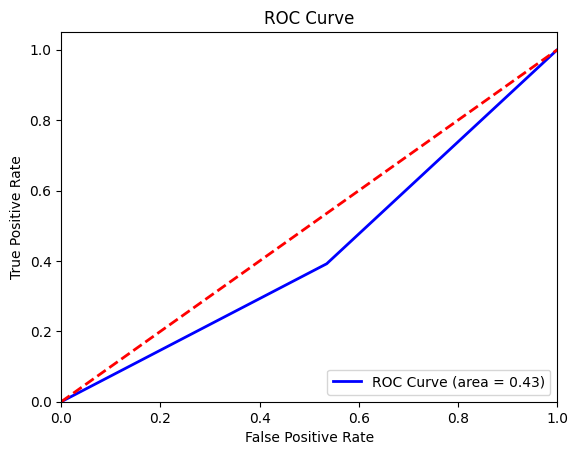

In [38]:
from sklearn.metrics import roc_curve, auc
y = relacao['obito'].replace({"nao": 0, "sim": 1})

# ROC Curve
fpr, tpr, _= roc_curve(y, modelo1.fittedvalues)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label = "ROC Curve (area = %0.2f)" % roc_auc)
plt.plot([0,1],[0,1], color='red', lw=2, linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Modelo 2: Mais de uma variável independente
Agora queremos modelar o óbito relacionado a pessoa ter diabetes e seu gênero

In [39]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [40]:
relacao['diabetes'].value_counts()

,count
diabetes,
IGNORADO,480845
SIM,33614
NÃO,14595


In [41]:
import plotly.express as px
px.pie(relacao, names='diabetes')

Observa-se um número alto de ignorado. Nestes casos devemos tomar muito cuidado, pois temos muitos dados faltantes.\
Sempre é necessário avaliar se ao excluir esses dados massivos não iremos alterar a proporção do conjunto de dados.

In [42]:
relacao2 = relacao.loc[relacao.diabetes != 'IGNORADO']

In [43]:
px.pie(relacao2, names='diabetes')

Analisando a proporção do óbito **antes** da exclusão de ignorados em diabetes

In [44]:
px.pie(relacao, names='obito')

Analisando a proporção do óbito **depois** da exclusão de ignorados em diabetes.\
O ideal era que após a exclusão, a proporção fosse mantida entretanto, isso não aconteceu.

In [45]:
px.pie(relacao2, names='obito')

In [46]:
relacao2.dtypes

,0
nome_munic,object
codigo_ibge,int64
idade,float64
cs_sexo,category
diagnostico_covid19,object
data_inicio_sintomas,object
obito,category
asma,object
cardiopatia,object
diabetes,object


In [47]:
relacao2['diabetes'] = relacao2['diabetes'].astype('category')

In [48]:
relacao2.dtypes

,0
nome_munic,object
codigo_ibge,int64
idade,float64
cs_sexo,category
diagnostico_covid19,object
data_inicio_sintomas,object
obito,category
asma,object
cardiopatia,object
diabetes,category


## Criação do modelo 2
**Análise do modelo:**
- Verificar a significância dos coeficientes:
  - Estatísticamente significativo: p <= 0.05
  - Estatísticamente não significativo: p > 0.05
- Análise da Ausência de outliers e pontos de alavancagem
  - Deve estar entre -3 e 3
- Ausência de Multicolinearidade entre as variáveis independentes

In [49]:
modelo2 = smf.glm(formula = 'obito ~ cs_sexo + diabetes', data=relacao2, family = sm.families.Binomial()).fit()
print(modelo2.summary())

                      Generalized Linear Model Regression Results                       
Dep. Variable:     ['obito[nao]', 'obito[sim]']   No. Observations:                48209
Model:                                      GLM   Df Residuals:                    48206
Model Family:                          Binomial   Df Model:                            2
Link Function:                            Logit   Scale:                          1.0000
Method:                                    IRLS   Log-Likelihood:                -24347.
Date:                          Fri, 16 Aug 2024   Deviance:                       48694.
Time:                                  09:18:23   Pearson chi2:                 4.81e+04
No. Iterations:                               4   Pseudo R-squ. (CS):            0.03272
Covariance Type:                      nonrobust                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
---------------------

## Deviance Residuals
**Hipótese Testada**
- $H_0:$ O modelo ajusta bem os dados.
- $H_a:$ O modelo não ajusta bem os dados.
**Condição de Aceitação/Rejeição:**
- A deviance total é comparada com uma distribuição qui-quadrado com $n-p$ graus de liberdade, onde $n$ é o número de observações e $p$ é o número de parâmetros no modelo.
- **Aceitação de $H_0$:** Se o valor $p$ calculado a partir da deviance é maior que $\alpha$, aceitamos $H_0$ e concluímos que o modelo ajusta bem os dados.
- **Rejeição de $H_0$:** Se o valor $p$ é menor que $\alpha$, rejeitamos $H_0$ e concluímos que o modelo não ajusta bem os dados.

In [50]:
# Teste de Deviance para os resíduos
deviance_test_statistic = modelo2.deviance
deviance_df = modelo2.df_resid
deviance_p_value = 1 - stats.chi2.cdf(deviance_test_statistic, deviance_df)

print("Teste de Deviance para os Resíduos:")
print("Estatística de teste:", deviance_test_statistic)
print("Graus de liberdade:", deviance_df)
print("Valor_p:", deviance_p_value)

Teste de Deviance para os Resíduos:
Estatística de teste: 48693.748310726005
Graus de liberdade: 48206
Valor_p: 0.05847416011095874


## Pearson Chi-Square Test
**Hipótese Testada**
- $H_0:$ O modelo ajusta bem os dados.
- $H_a:$ O modelo não ajusta bem os dados.
**Condição de Aceitação/Rejeição:**
- Calcula-se a estatística do teste qui-quadrado de PEarson, que segue uma distribuição qui-quadrado com $n-p$ graus de liberdade.
- **Aceitação de $H_0$:** Se o valor $p$ é maior que $\alpha$, aceitamos $H_0$ e concluímos que o modelo ajusta bem os dados.
- **Rejeição de $H_0$:** Se o valor $p$ é menor que $\alpha$, rejeitamos $H_0$ e concluímos que o modelo não ajusta bem os dados.

In [51]:
# Obtendo os resíduos de PEarson
residuos_pearson = modelo2.resid_pearson

# Teste de Pearson para os Resíduos
pearons_test_statistic = np.sum(residuos_pearson ** 2)
pearson_df = len(residuos_pearson) - modelo2.df_model - 1 # Graus de liberdade corrigidos
pearson_p_value = 1 - stats.chi2.cdf(pearson_test_statistic, pearson_df)

print("Teste de Pearson para os Resíduos:")
print('Estatística de teste:', pearson_test_statistic)
print('Graus de liberdade:', pearson_df)
print('Valor p:', pearson_p_value)

Teste de Pearson para os Resíduos:
Estatística de teste: 529053.9999999754
Graus de liberdade: 48206
Valor p: 0.0


In [52]:
modelo2.params

,0
Intercept,0.959777
cs_sexo[T.MASCULINO],-0.369629
diabetes[T.SIM],0.821753


In [53]:
np.exp(modelo2.params[2]) # Odds ratio

2.27448301114534

**Comparação de modelos**

In [54]:
# Calcular a diferença nos log-likelihoods
diff_ll = modelo2.llf - modelo1.llf

# Calcular o número de graus de liberdade (número de parâmetros adicionais em modelo2)
df = modelo2.df_model - modelo1.df_model

# Realizar o teste de razão de verossimilhança
p_value = 1 - stats.chi2.cdf(diff_ll, df)

# Imprimir o resultado do teste
print("Teste de Razão de Verossimilhança:")
print("Estatística de teste:", diff_ll)
print("Graus de liberdade:", df)
print("Valor p:", p_value)

Teste de Razão de Verossimilhança:
Estatística de teste: 48533.48626806737
Graus de liberdade: 1
Valor p: 0.0


# ROC Curve and AUC
Avalia a capacidade do modelo de discriminar entre as classes.\
**Curva ROC:** Traça a taxa de verdadeiros positivos (sensibilidade) contra a taxa de falsos positivos (1 - especificidade) para vários limiares de classificação.\
**AUC (Área sobre a curva):** Um valor próximo de 1 indica excelente discriminação, enquanto um valor próximo de 0.5 indica discriminação aleatória.\
**Avaliação do Modelo:** Um modelo com AUC maior considerado melhor em discriminar entre as classes.

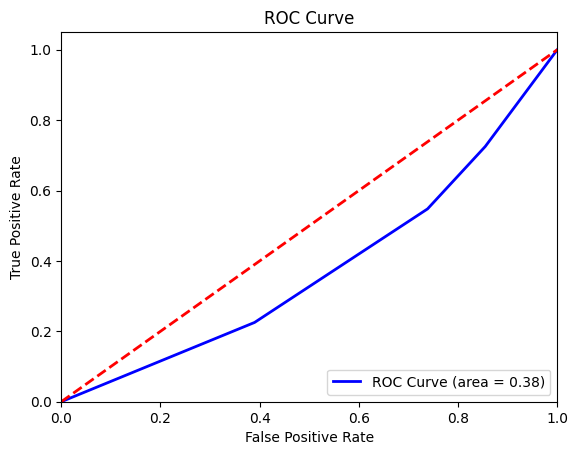

In [55]:
from sklearn.metrics import roc_curve, auc

y = relacao2['obito'].replace({"nao": 0, 'sim': 1})

# ROC Curve
fpr, tpr, _ = roc_curve(y, modelo2.fittedvalues)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC Curve (area = %0.2f)' % roc_auc)
plt.plot([0,1],[0,1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
plt.show()

# Modelo 3: Variável independente numérica
Relação da pessoa ir a óbito con sua idade.\
Vamos fazer uma análise para a cidade de Santos e testar em outra cidade

In [56]:
relacao3 = doenca_pre.loc[doenca_pre.nome_munic=='Santos']

In [57]:
relacao3.head()

,nome_munic,codigo_ibge,idade,cs_sexo,diagnostico_covid19,data_inicio_sintomas,obito,asma,cardiopatia,diabetes,doenca_hematologica,doenca_hepatica,doenca_neurologica,doenca_renal,imunodepressao,obesidade,outros_fatores_de_risco,pneumopatia,puerpera,sindrome_de_down
43,Santos,3548500,42.0,MASCULINO,CONFIRMADO,2020-12-02,0,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO
47,Santos,3548500,43.0,MASCULINO,CONFIRMADO,2020-06-03,0,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO
53,Santos,3548500,51.0,MASCULINO,CONFIRMADO,2020-12-06,0,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO
206,Santos,3548500,23.0,FEMININO,CONFIRMADO,2020-05-18,0,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO
267,Santos,3548500,46.0,MASCULINO,CONFIRMADO,2020-10-17,0,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO


In [58]:
relacao3.shape

(10358, 20)

In [59]:
relacao3.dtypes

,0
nome_munic,object
codigo_ibge,int64
idade,float64
cs_sexo,object
diagnostico_covid19,object
data_inicio_sintomas,object
obito,int64
asma,object
cardiopatia,object
diabetes,object


In [60]:
relacao3.isnull().sum()

,0
nome_munic,0
codigo_ibge,0
idade,6
cs_sexo,0
diagnostico_covid19,0
data_inicio_sintomas,73
obito,0
asma,0
cardiopatia,0
diabetes,0


In [61]:
relacao3.dropna(subset=['idade'], inplace=True)

Verificando a relação entre idade e obito com um gráfico de dispersão

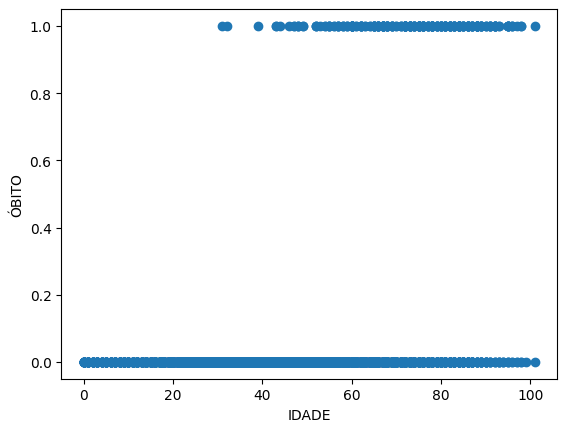

In [62]:
import matplotlib.pyplot as plt
plt.scatter(relacao3.idade, relacao3.obito)
plt.xlabel('IDADE')
plt.ylabel('ÓBITO')
plt.grid(False)
plt.show()

**Correlação**\
\
Não há multicolinearidade -> correlação fraca

In [64]:
print(np.corrcoef(relacao3.obito, relacao3.idade))

[[1.         0.28012022]
 [0.28012022 1.        ]]


## Criação do modelo 3 com StatsModels

In [65]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

In [66]:
modelo3 = smf.glm(formula='obito ~ idade', data=relacao3, family = sm.families.Binomial()).fit()
print(modelo3.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  obito   No. Observations:                10352
Model:                            GLM   Df Residuals:                    10350
Model Family:                Binomial   Df Model:                            1
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -859.98
Date:                Fri, 16 Aug 2024   Deviance:                       1720.0
Time:                        09:26:10   Pearson chi2:                 7.72e+03
No. Iterations:                     8   Pseudo R-squ. (CS):            0.07727
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -10.3574      0.358    -28.896      0.0

**Análise do Modelo** \

- Verificar a significância dos coeficientes (Teste de Wald):
  - Estatisticamente significativo: p <= 0.05
  - Estatisticamente não significativo: p > 0.05
- Análise de resíduos

# Deviance Residuals
**Hipótese Testada:**
- $H_0:$ O Modelo ajusta bem os dados.
- $H_a:$ O Modelo não ajusta bem os dados
**Condição de Aceitação/Rejeição:**
- A deviance total é comparada com uma distribuição qui-quadrado com $n - p$ graus de liberdade, onde $n$ é o número de observações e $p$ é o número de parâmetros do modelo.
- **Aceitação de $H_0$:** Se o valor $p$ calculado a partir da deviance é maior que $\alpha$, aceitamos $H_0$ e concluímos que o modelo ajusta bem os dados.
- **Rejeição de $H_0$:** Se o valor $p$ é menor que $\alpha$, rejeitamos $H_0$ e concluímos que o modelo não ajusta bem os dados.

In [67]:
deviance_test_statistic = modelo3.deviance
deviance_df = modelo3.df_resid
deviance_p_value = 1 - stats.chi2.cdf(deviance_test_statistic, deviance_df)

print("Teste de Deviance para os Resíduos:")
print("Estatística de Teste:", deviance_test_statistic)
print("Graus de liberdade:", deviance_df)
print("Valor P:", deviance_p_value)

Teste de Deviance para os Resíduos:
Estatística de Teste: 1719.96018461241
Graus de liberdade: 10350
Valor P: 1.0


## Pearson Chi-Square Test
**Hipótese Testada:**
- $H_0:$ O Modelo ajusta bem os dados.
- $H_a:$ O Modelo não ajusta bem os dados
**Condição de Aceitação/Rejeição:**
- Calcula-se a estatística do teste qui-quadrado de Pearson, que segue uma distribuição qui-quadrado com $n - p$ graus de liberdade.
- **Aceitação de $H_0$:** Se o valor $p$ é maior que $\alpha$, aceitamos $H_0$ e concluímos que o modelo ajusta bem os dados.
- **Rejeição de $H_0$:** Se o valor $p$ é menor que $\alpha$, rejeitamos $H_0$ e concluímos que o modelo não ajusta bem os dados.

In [68]:
residuos_pearson = modelo3.resid_pearson

pearson_test_statistic = np.sum(residuos_pearson ** 2)
pearson_df = len(residuos_pearson) - modelo3.df_model - 1
pearson_p_value = 1 - stats.chi2.cdf(pearson_test_statistic, pearson_df)

print("Teste de Pearson para os Resíduos")
print("Estatística de Teste:", pearson_test_statistic)
print("Graus de Liberdade:", pearson_df)
print("Valor P:", pearson_p_value)

Teste de Pearson para os Resíduos
Estatística de Teste: 7720.733372123228
Graus de Liberdade: 10350
Valor P: 1.0


## Interpretação dos coeficientes

In [69]:
# Razão de chance com Intervalo de confiança de 95%
np.exp(modelo3.params[1])

1.1195568642425229

# ROC Curve and AUC
Avalia a capacidade do modelo de discriminar entre as classes.\
**Curva ROC:** Traça a taxa de verdadeiros positivos (sensibilidade) contra a taxa de falsos positivos (1 - especificidade) para vários limiares de classificação.\
**AUC (Área sobre a curva):** Um valor próximo de 1 indica excelente discriminação, enquanto um valor próximo de 0.5 indica discriminação aleatória.\
**Avaliação do Modelo:** Um modelo com AUC maior considerado melhor em discriminar entre as classes.

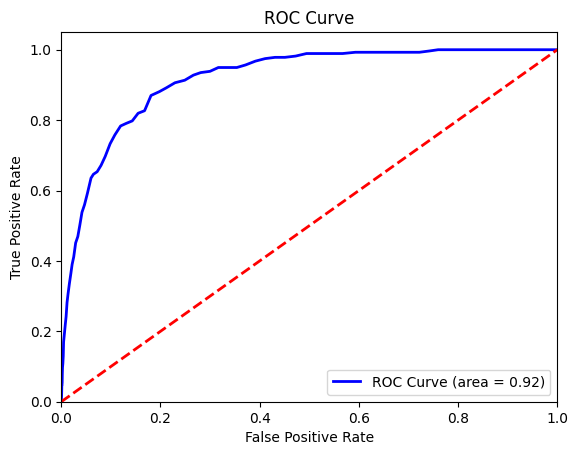

In [71]:
y = relacao3['obito'].replace({'nao': 0, 'sim': 1})
#ROC Curve
fpr, tpr, _ = roc_curve(y, modelo3.fittedvalues)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color="blue", lw=2, label='ROC Curve (area = %0.2f)' % roc_auc)
plt.plot([0,1], [0,1], color="red", lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc="lower right")
plt.show()

# Criação do modelo 3 com Sklearn


In [72]:
from sklearn.linear_model import LogisticRegression

In [73]:
relacao3.head()

,nome_munic,codigo_ibge,idade,cs_sexo,diagnostico_covid19,data_inicio_sintomas,obito,asma,cardiopatia,diabetes,doenca_hematologica,doenca_hepatica,doenca_neurologica,doenca_renal,imunodepressao,obesidade,outros_fatores_de_risco,pneumopatia,puerpera,sindrome_de_down
43,Santos,3548500,42.0,MASCULINO,CONFIRMADO,2020-12-02,0,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO
47,Santos,3548500,43.0,MASCULINO,CONFIRMADO,2020-06-03,0,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO
53,Santos,3548500,51.0,MASCULINO,CONFIRMADO,2020-12-06,0,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO
206,Santos,3548500,23.0,FEMININO,CONFIRMADO,2020-05-18,0,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO
267,Santos,3548500,46.0,MASCULINO,CONFIRMADO,2020-10-17,0,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO,IGNORADO


In [75]:
x = relacao3.iloc[:,2].values
x

array([42., 43., 51., ..., 30., 33., 34.])

In [76]:
y = relacao3.iloc[:, 6].values
y

array([0, 0, 0, ..., 0, 0, 0])

Transformando X para matriz

In [77]:
x = x.reshape(-1,1)
x

array([[42.],
       [43.],
       [51.],
       ...,
       [30.],
       [33.],
       [34.]])

In [78]:
modelo3s = LogisticRegression()
modelo3s.fit(x, y)

LogisticRegression()

In [79]:
modelo3s.coef_

array([[0.11293082]])

In [80]:
modelo3s.intercept_

array([-10.35722812])

In [82]:
np.exp(modelo3s.coef_) # Para cada ano mais velho, o individuo aumenta 1.12 pontos a chance de vir a óbito

array([[1.11955448]])

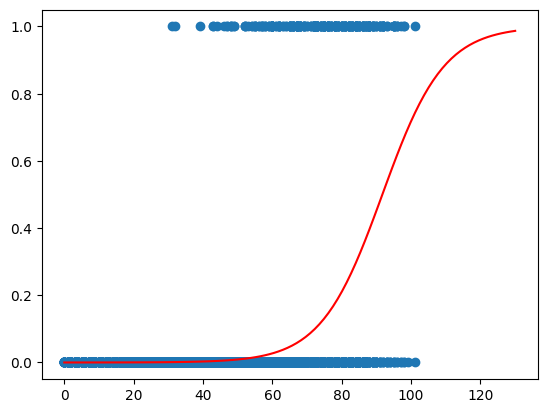

In [84]:
plt.scatter(x,y)
# Geração de novos dados para gerar a função sigmoide
x_teste = np.linspace(0, 130, 100)

def model(w):
  return 1/(1 + np.exp(-w))

previsao = model(x_teste * modelo3s.coef_ + modelo3s.intercept_).ravel()
plt.plot(x_teste, previsao, color='red')